<div style="border:solid Chocolate 2px; padding: 40px">

<b>Никита, приветствую!</b>

Буду рада с тобой познакомиться. Меня зовут Евгения Маракова и я буду ревьюером твоего проекта. Если ты не против, то предлагаю общаться на "ты":) Если удобнее на "вы", то нет проблем, только скажи об этом.

В процессе работы ты встретишь комментарии <font color='green'>зеленого</font>, <font color='gold'>желтого</font> и <font color='red'>красного</font> цветов. Что они значат, смотри ниже:
    <br/>

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Решение на этом шаге является полностью правильным.
</div>

<br/>

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Решение на этом шаге станет еще лучше, если внести небольшие коррективы.
</div>


<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
 Решение на этом шаге требует существенной переработки и внесения правок. Напоминаю, что проект не может быть принят с первого раза, если ревью содержит комментарии, рекомендующие доработать шаги.
</div>
    
Увидев мой комментарий, не удаляй его, он будет очень полезен в случае повторной проверки работы😊
    
Свой комментарий помечай так, как показано ниже, тогда нам будет легче вести диалог, а мне выполнить повторную проверку проекта.
    <div class="alert alert-info"> <b>Комментарий студента: </b> </div>
    


# Исследование рынка заведений общественного питания Москвы

## Цель проекта: 

Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

### **Описание столбцов:**
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  - «Средний счёт: 1000–1500 ₽»;
  - «Цена чашки капучино: 130–220 ₽»;
  - «Цена бокала пива: 400–600 ₽».
       и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

## Загрузка и изучение данных

In [1]:
# имортируме библиотеки, которые потребуются для работы
import pandas as pd
import seaborn as sns
import matplotlib as plt
import numpy as np
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

In [2]:
# загружаем датафрейм
df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
# возвращаем первые 5 строк,для ознакомления с данными
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
# получаем общую ифнормацию о данных
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Вывод:** Выведя общую информацию о датасете, мы видим,что у нас 8406 строк. Также можно увидеть,что большенство данных типа object и float64. Требуется замена типа данных в колонках chain и seats, в колонке chain булев тип данных,то есть данные принимают значение 0 или 1. В колонке seats больше подойдет тип int64,потому что в колонке заключены данные о количестве посадочных мест,а их не может быть 5.5. Этим мы займемся далее.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Молодец, ты отлично познакомился с данными!
</div>

## Преддоработка данных

### Изменение типа данных

In [5]:
# заменим типы данных столбцов chain и seats
df['chain'] = df['chain'].astype('bool')
df['seats'] = (df['seats'].fillna(0)).astype('int')
df.dtypes

name                  object
category              object
address               object
district              object
hours                 object
lat                  float64
lng                  float64
rating               float64
price                 object
avg_bill              object
middle_avg_bill      float64
middle_coffee_cup    float64
chain                   bool
seats                  int64
dtype: object

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Тип данных изменен верно!
</div>

### Изучим пропуски в данных

In [6]:
# напишем функцию, которая возвращает количество и процент пропусков в столбцах
def nan_values(df,list_nans=['', ' ', '""', '" "', None, np.nan]):
    
    list_count=[]
    list_share=[]    
    
    for col in df.columns:
        try:
            list_count.append(sum(df[col].isin(list_nans)))
            list_share.append(round(sum(df[col].isin(list_nans)) * 100 / len(df), 2))
        except: 
            list_count.append(sum(df[col].isnull()))
            list_share.append(round(sum(df[col].isnull()) * 100 / len(df), 2))
            continue
        
    missing_value_df = pd.DataFrame({'Название столбца': df.columns,
                                     'Количество пропусков': list_count,
                                     'Процент пропусков': list_share})
    
    return missing_value_df

nan_values(df)

,Название столбца,Количество пропусков,Процент пропусков
0,name,0,0.00
1,category,0,0.00
2,address,0,0.00
3,district,0,0.00
4,hours,536,6.38
5,lat,0,0.00
6,lng,0,0.00
7,rating,0,0.00
8,price,5091,60.56
9,avg_bill,4590,54.60


**Вывод:** В столбце часы работы пропуски составляют всего 6%, то есть в районе 500 заведений из 8500 тысяч,пропуски в данном столбце можно не заполнять,они скорее всего не повлеяют на дальнейшие исследования. Ощутимое количество пропусков присутсвуют в таких столбцах,как прайс, средная стоиомсть заказа, средний чек и средняя цена чашки кофе и составляют от 55 до 95% от всего датафрейма. Пропуске в столбце прайс заполнить какими-то значениями будет затруднительно,так как категории в данном столбце проставляются независимо от остальных столбцов и скорее всего проставляется самим владельцем бизнеса, такая же ситуация и со столбцом avg_bill. В столбце middle_avg_bil пропуски только там,где нет информации в avg_bill или она указана только для чашки кофе и бокала пива,точно такая же ситуация с для столбца middle_coffee_cup, поэтому заполнять их не будем

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Молодец, что не стал заполнять и, тем более, удалять пропуски. Это исказило бы исследование!
</div>

### Изучим дубликаты в данных

In [7]:
#напишем функцию, которая возвращает уникальные значения и количество уникальных значений в столбце
def describe_cols(df):
    
    values = pd.DataFrame()
    
    for col in df.columns:
        values[col] = [df[col].unique(), df[col].nunique()]
        
    return values.transpose().sort_values(by=1, ascending=True).rename(
        {0: 'Значения', 1: 'Кол-во уникальных значений'}, axis=1)
describe_cols(df)

,Значения,Кол-во уникальных значений
chain,"[False, True]",2
price,"[nan, выше среднего, средние, высокие, низкие]",4
category,"[кафе, ресторан, кофейня, пиццерия, бар,паб, б...",8
district,"[Северный административный округ, Северо-Восто...",9
rating,"[5.0, 4.5, 4.6, 4.4, 4.7, 4.8, 4.3, 4.9, 4.2, ...",41
middle_coffee_cup,"[nan, 170.0, 145.0, 150.0, 180.0, 120.0, 100.0...",96
seats,"[0, 4, 45, 148, 79, 65, 102, 180, 96, 25, 46, ...",229
middle_avg_bill,"[nan, 1550.0, 1000.0, 500.0, 199.0, 250.0, 110...",230
avg_bill,"[nan, Средний счёт:1500–1600 ₽, Средний счёт:о...",897
hours,"[ежедневно, 10:00–22:00, пн-чт 11:00–02:00; пт...",1307


**Вывод:** В целом дубликаты во всех столбцах выгледят нормально. 

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Хорошо!
</div>

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
Необходимо рассмотреть явные и неявные дубли, используя метод duplicated().
</div>

<div class="alert alert-info"> <b>Комментарий студента: Евгения, привет! В первую очередь хочу поблагодарить тебя за ревью проекта, далее постараюсь исправить замечания. </b> </div>

In [8]:
# Возвращаём Series с количеством явными дубликатами в каждом столбце
def describe_cols(df):
    
    values = pd.DataFrame()
    
    for col in df.columns:
        values[col] = [df[col].duplicated().sum()] 
        
    return values.transpose().sort_values(by=0, ascending=True).rename(
        {0: 'Количество явных дубликатов'},axis=1)
describe_cols(df)

,Количество явных дубликатов
lng,148
lat,197
address,2653
name,2792
hours,7098
avg_bill,7508
middle_avg_bill,8175
seats,8177
middle_coffee_cup,8309
rating,8365


**Вывод:** Дубликаты в таких столбцах,как: 
- 'lng'
- 'lat'
- 'address'
- 'street'
- 'street'
- 'avg_bill'
- 'middle_avg_bill'
- 'seats'
- 'middle_coffee_cup'
- 'rating'
- 'district'
- 'category'
- 'price'
- 'chain'
- 'is_24/7'

Выглядят нормально

Дубликаты в столбцы с названием заведения можно объяснить тем,что существуют такие название, как 'кафе' или 'булочная', которые повторяются. Или названия больших сетевых заведений. Удалять такие названия считаю не правильным.

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Принято!
</div>

### Добавим новые столбцы

In [9]:
# добавляем столбец с улицей
df['street'] = df['address'].str.split(r',\s*').str[1]
# создаём функцию для добавления столбца с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
def hours_24(hours):
    
    if hours == 'ежедневно, круглосуточно':
        return True
    else:
        return False

df['is_24/7'] = df['hours'].apply(hours_24)
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,0,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,0,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148,Правобережная улица,False


<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Стоит вывести таблицу с добавленными столбцами, чтобы убедиться в корректности проделанной работы:)
</div>

<div class="alert alert-info"> <b>Комментарий студента: Возвращаю таблицу:) </b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Красота!
</div>

## Анализ данных

#### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [10]:
# создание сводной таблицы для вывода кол-ва заведений в каждой категории 
df_pivot_category = df.pivot_table(index = 'category',
                                   values = 'name',
                                   aggfunc = 'count') 
sort_category = df_pivot_category.sort_values(by = 'name', ascending = False).reset_index()
sort_category

,category,name
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


Text(0.5, 1.0, 'Распределение количества заведений по категориям')

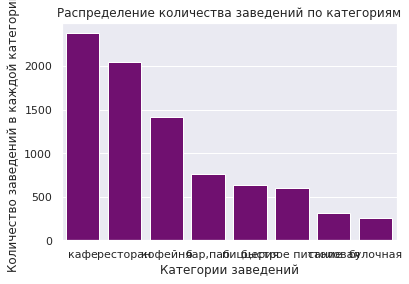

In [11]:
# задаём размеры графикам и строим гистограмму
sns.set(rc={'figure.figsize':(14.7,8.27)})
ax = sns.barplot(data =sort_category ,x='category',y = 'name',color = 'purple')
ax.set_xlabel('Категории заведений')
ax.set_ylabel('Количество заведений в каждой категории')
ax.set_title('Распределение количества заведений по категориям')

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
Данные на графиках обязательно сортируем.
</div>

<div class="alert alert-info"> <b>Комментарий студента: Отсортировал </b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> +
</div>

**Вывод:** В данных представленны такие категории заведений,как: 
- бар,паб (765шт.);
- булочная (256шт.);
- быстрое питание (603шт.);
- кафе (2378шт.);
- кофейня (1413шт.);
- пиццерия (633шт.);
- ресторан (2043шт.);
- столовая (315шт.).

Как мы видим большинство заведений приходится на рестораны и кафе, также популярны кофейни,далее идут бары,пабы и т.д.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Верный вывод!
</div>

#### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.


Text(0.5, 1.0, 'Распределение количества посадочных мест по категориям')

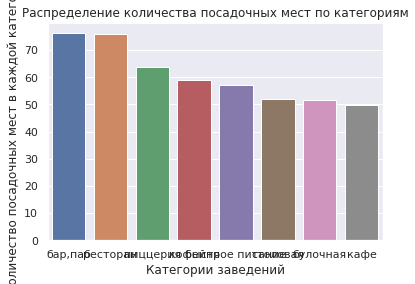

In [12]:
df_count_seats = df.groupby('category')['seats'].agg('mean').reset_index().sort_values(by = 'seats',ascending =False)
# строим барплот для отображения категориальных данных
ax = sns.barplot(data = df_count_seats,x='category', y ='seats')

ax.set_xlabel('Категории заведений')
ax.set_ylabel('Количество посадочных мест в каждой категории')
ax.set_title('Распределение количества посадочных мест по категориям')

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
Сортировка.
</div>

<div class="alert alert-info"> <b>Комментарий студента: Отсортировал </b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> +
</div>

**Вывод:** Большинство посадочных мест,как и предполагалось в ресторанах и барах, затем идут пиццерии. Интересно,что в кофейнях,где формат в основном 'take a way' больше кол-во посадочных мест чем в тех же кафе или ресторанах быстрого питания.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Отлично!
</div>

#### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

Количество несетевых заведений: 5201. В процентах от всего фрейма: 61.87%
Количество сетевых заведений: 3205. В процентах от всего фрейма: 38.13%


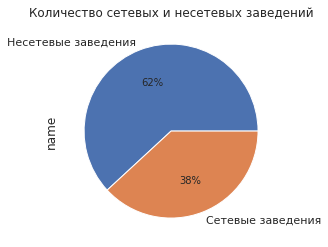

In [13]:
# строим круговую диаграмму
labels = ["Несетевые заведения", "Сетевые заведения"]
ax = df.groupby('chain')['name'].count().plot(kind='pie',
                                         labels = labels,
                                         autopct='%1.0f%%',
                                         title='Количество сетевых и несетевых заведений')
count_rest = df['name'].count()
chain_rest = df.groupby('chain')['name'].count()
print(f'Количество несетевых заведений: {chain_rest[0]}. В процентах от всего фрейма: {chain_rest[0]/count_rest:.2%}')
print(f'Количество сетевых заведений: {chain_rest[1]}. В процентах от всего фрейма: {chain_rest[1]/count_rest:.2%}')

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
 Подписать название и отсортировать значения. Вообще, рекомендую заменить график на круговую диаграмму, соотношение она отразит лучше. На данном графике у тебя представлено тоже, что и ниже:)
</div>

<div class="alert alert-info"> <b>Комментарий студента: Последовал рекомендациям и заменил на круговую. Так и правда лучше:) </b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Ну и прекрасно:)
</div>

**Вывод:** Отобразив отношение сетевых и несетвых заведений, можно сделать вывод,что несетевых заведений больше.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Совершенно верно!
</div>

In [14]:
# группируем и строим график
sort_cat = df.groupby(['category','chain'])['name'].count().reset_index().sort_values(by='name',ascending = False)
sort_cat.columns = ['Категории','Сетевое','Количество']

fig = px.bar(sort_cat,
             x='Категории',
             y='Количество',
             color='Сетевое',
             barmode="group",
             title = 'Отношение сетевых и несетевых заведений по категориям')
fig.update_xaxes(tickangle=45)
fig.show()

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
 Подписать название, сортировка.
</div>

<div class="alert alert-info"> <b>Комментарий студента:Подписал и постарался отсортировать :)</b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Все верно выполнил!
</div>

**Вывод:** Разница в отношении больше всего видна на категориях рестораны и кафе. У кофейн и пиццерий разницы в отношениях практически нет,то есть они чаще являются сетевыми, самая большая разница в категории бар, паб. Можно выдвинуть гипотезу о том,что проще развивать сеть кофейн или пиццерий.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> А также стоит обратить внимание на булочные:)
</div>

#### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [15]:
# группируем сети заведений и визуализируем
top_15_chain =df.loc[df['chain'] == True].groupby('name')['name'].agg('count')
top_15_sort = top_15_chain.sort_values(ascending =False)
sort_top = top_15_sort.head(15)
fig = px.bar(sort_top, x='name', title='Топ 15 сетей Москвы')
fig.show()

**Вывод:** Лидером среди сетей по Москве с большим отравом является "Шоколадница", категория этого заведения - кофейня. Далее по убывающей идут "Домино'c Пицца" и "Додо Пицца", категория этих заведений - пиццерия. Присутствует скорее всего ряд признаков,которые объёдиняет эти сети: у них есть посадочные места,а также возможность взять еду с собой,это чаще фидеральные сети,их филиалы представлены во многих городах, также возможно высокая скорость подачи блюд сохраняя их качество.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Задание выполнено верно!
</div>

#### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.


In [16]:
# группируем
district_group = df.groupby(['district','category'])['name'].count().reset_index().sort_values(by=['name','category'])
district_group.columns = ['Район','Категория','Количество']

# визуалиция группировки                                                                                        )
fig = px.bar(district_group,
             x='Район',
             y='Количество',
             color='Категория',
             barmode="group",
             title = 'Количество заведений в каждой категории по районам Москвы')
fig.update_xaxes(tickangle=45)
fig.show()

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
 Подписать ось У и название у графика, выполнить сортировку.
</div>

<div class="alert alert-info"> <b>Комментарий студента:Подписал и также постарался отсортировать :)</b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Плюсик
</div>

**Вывод:** Построив график распределения разных категорий заведений относительно округов, можно сделать вывод о том, что большинство заведений находится в центральном округе и там больше всего ресторанов, то есть если открывать ресторан в центральном округе можно столкнуться с немалой конкуренцией,вместе с тем скорее всего платёжеспособность людей там выше. Меньше всего заведений в Северо-Восточном округе, кажется,что это наиболее интересный округ для открытия заведения,так как нет конкуренции, но чтобы сделать окончательный вывод необходимо провести анализ количества проживающих там людей и их платёжеспособности. По остальным округам распределение кол-ва заведений более менее одинаковое.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Согласна!
</div>

#### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

Text(0.5, 1.0, 'Распределение средних рейтингов')

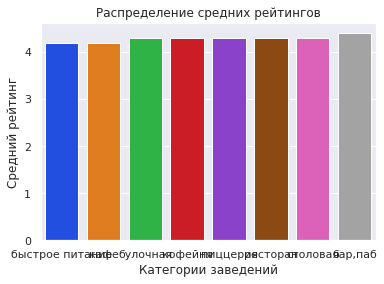

In [17]:
# групируем и визуализируем данные
rating_median = df.groupby('category')['rating'].agg('median').reset_index().sort_values(by = 'rating')

# строим графки 
fig = sns.barplot(data = rating_median,x = 'category',y = 'rating',palette = 'bright')
fig.set_ylabel('Средний рейтинг')
fig.set_xlabel('Категории заведений')
fig.set_title('Распределение средних рейтингов')

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
 Сортировка.
</div>

<div class="alert alert-info"> <b>Комментарий студента: Отсортировал :)</b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> +
</div>

**Вывод:** Сильных отличий в распредедении среднего рейтинга нет, наименьший средний рейтинг у категории 'быстрое питание',так как скорее всего для заведений этой категории свойств упор на скорость работы и цену,а не качество обслуживания и т.д. Наивысший средний рейтинг у баров, скорее всего потому что заведения подобного формата больше беспокоятся о качестве предоставляемых услуг в целом.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Хорошо!
</div>

#### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [18]:
# группируем данные
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [19]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [20]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Построив картограмму среднего рейтинга по регионам можно увидеть,что самый высокий рейтинг у центрального регоина. 

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Решение на этом шаге является полностью правильным.
</div>

#### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [21]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Карта отображается корректно!
</div>

#### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

**Комментарий ревьюеру:** Возникли сложности с построеним графика в данном задании, предоставил 2 вида визуализации, но оба из них не очень нравятся,буду рад совету,если скажешь как лучше визуализировать:)

**Первая реализация**

(1.0, 14.5)

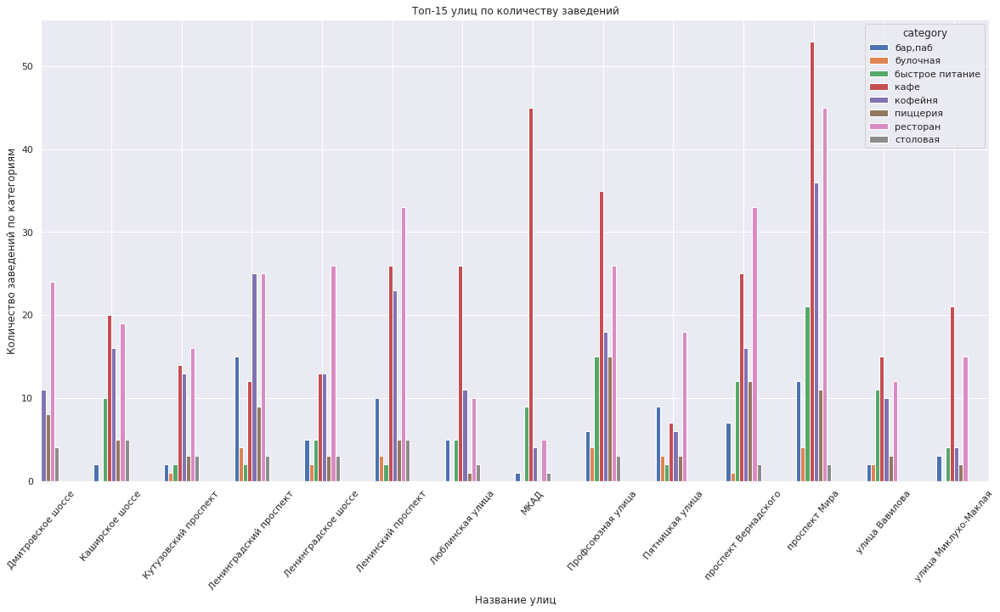

In [22]:
# возвращаем 15 улиц с максимальных количеством заведений
df_street_15 = df['street'].value_counts().head(15).index
# делаем сводную таблицу 
df_pivot_street = df.loc[df['street'].isin(df_street_15)].pivot_table(
                                                                       index = 'street',
                                                                       columns = 'category',
                                                                       values = 'name',
                                                                       aggfunc = 'count')
# строим график 
ax = df_pivot_street.plot(figsize =(20,10),grid = True, kind = 'bar',rot=50, fontsize=11)
ax.set_xlabel('Название улиц')
ax.set_ylabel('Количество заведений по категориям')
ax.set_title('Топ-15 улиц по количеству заведений')
ax.set_xlim(1)

**Вторая реализация**

проспект Мира             184
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       65
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Name: street, dtype: int64

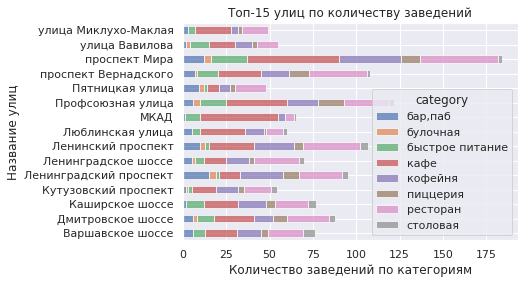

In [23]:
fig = df_pivot_street.plot.barh(stacked = True, alpha = 0.7)

fig.set_xlabel('Количество заведений по категориям')
fig.set_ylabel('Название улиц')
fig.set_title('Топ-15 улиц по количеству заведений')

df['street'].value_counts().head(15)

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Никита, оба графика хорошие и отлично отображают информацию. Мне лично больше нравится второй вариант. Чтоб они были еще красивее, не хватает сортировки. Оставлю тебе ссылки, по построению графиков с накоплением, взгляни, вдруг пригодиться: https://www.shanelynn.ie/bar-plots-in-python-using-pandas-dataframes/ https://habr.com/ru/articles/468295/ По сортировке: https://stackoverflow.com/questions/70052556/how-to-order-the-bars-in-a-seaborn-barplot https://stackoverflow.com/questions/58775254/how-to-order-stacked-bar-chart-in-descending-order
</div>

<div class="alert alert-info"> <b>Комментарий студента: Понял,буду сейчас пытаться разбираться,спасибо за ссылки! :)</b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Вообще рекомендую сначала сортировать данные в таблицах, а затем по ним строить графики:)
</div>

#### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [24]:
# возвращаем кол-во улиц с одним заведением
count_street = df['street'].count()
one_rest_on_street = df.groupby('street')['street'].count()
one_rest_on_street = one_rest_on_street[one_rest_on_street == 1]
print(f'Количество улиц с одним заведением {one_rest_on_street.count()}')
print(f'Процент улиц с одним завеведнием: {(one_rest_on_street.count()/count_street):.2%}')

Количество улиц с одним заведением 458
Процент улиц с одним завеведнием: 5.45%


In [25]:
# возвращаем датасет с улицами с одним заведением
index_street = one_rest_on_street.index
one_rest = df.query('street in @index_street').reset_index()
one_rest.head(5)

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,False,180,улица Бусиновская Горка,False
1,21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,False,0,Прибрежный проезд,False
2,25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,True,0,парк Левобережный,False
3,58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,True,0,Угличская улица,False
4,60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,True,0,ландшафтный заказник Лианозовский,False


In [26]:
# какие категории у этих заведений
group = df.query('street in @index_street').groupby('category')['name'].count().sort_values(ascending= False)
group

category
кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: name, dtype: int64

In [27]:
one_rest.groupby('chain')['street'].count()

chain
False    325
True     133
Name: street, dtype: int64

**Вывод:** В целом во всём датасете улиц с одним заведений всего 5.45% от всего датасета. В большинстве своём это кафе и рестораны,на третьем месте идут кофейне. В основном это не сетевые заведения. 

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Замечательно!
</div>

#### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [28]:
median_avg_bill = df.groupby('district')['middle_avg_bill'].median().reset_index()
median_avg_bill.columns = ['district','median']
median_avg_bill

,district,median
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [29]:
# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_avg_bill,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная цена заведений по районам',
).add_to(m1)

# выводим карту
m1

**Вывод:** Как и следовало ожидать, самые высокие медианные цены в заведениях в центральном районе. Удивительно то,что распределение медианных цен не равномерно уменьшается при удалении от центра, как предполагалось,а распределяется другим образом. В левой средней части Москвы медианные цены также высоки,как и в центральном округе, в правой же части цены значительно ниже. В Южной части Москвы цены ниже, чем в Северной. Можно выдвинуть гипотезу о том,что в районах где медианные цены в заведениях выше, проживают более платёжеспособные жители и если выбирать место для открытия ресторана,то эти районы подойдут больше всего,если же необходимо открыть заведение вроде кофейни,то возможно рассмотеть районы с более низким медианным значением.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Отлично!
</div>

### Общий вывод:

**Категории представленные в датасете:**
- бар,паб (765шт.);
- булочная (256шт.);
- быстрое питание (603шт.);
- кафе (2378шт.);
- кофейня (1413шт.);
- пиццерия (633шт.);
- ресторан (2043шт.);
- столовая (315шт.).

Если хочется занять более свободную нишу,то исходя из данных лучше выбрать категорию булочных.Средний чек,конечно, будет ниже,чем в ресторане,зато конкуренция будет ниже.

**Информация о посадочных местах:**
- Большинство посадочных мест,как и предполагалось в ресторанах и барах, затем идут пиццерии. Интересно,что в кофейнях,где формат в основном 'take a way' больше кол-во посадочных мест чем в тех же кафе или ресторанах быстрого питания, так что если концепция заведения видется вам в большом кол-ве сидящих людей,то лучше выбрать для открытия бар,паб или ресторан.

**Распределение сетевых и несетевых заведений в датафрейме:**
- Количество несетевых заведений: 5201. В процентах от всего фрейма: 61.87%
- Количество сетевых заведений: 3205. В процентах от всего фрейма: 38.13%

**Какие категории заведений чаще являются сетевыми?**
- Разница в отношении больше всего видна на категориях рестораны и кафе. У кофейн и пиццерий разницы в отношениях практически нет,то есть они чаще являются сетевыми, самая большая разница в категории бар, паб. Можно выдвинуть гипотезу о том,что проще развивать сеть кофейн или пиццерий. Таким образом если выбирать франшизу для октрытия заведения,то в категориях кофейни и пиццерии будет скорее всего больше предложений от франшиз.

**Топ-15 сетей Москвы:**
- Лидером среди сетей по Москве с большим отравом является "Шоколадница", категория этого заведения - кофейня. Далее по убывающей идут "Домино'c Пицца" и "Додо Пицца", категория этих заведений - пиццерия. Присутствует скорее всего ряд признаков,которые объёдиняет эти сети: у них есть посадочные места,а также возможность взять еду с собой,это чаще фидеральные сети,их филиалы представлены во многих городах, также возможно высокая скорость подачи блюд сохраняя их качество. У франшиз этого топа скорее всего самые большие размеры суммы для входа и открытия торговой точки.

**Распределение заведений по округам Москвы:**
- Большинство заведений находится в центральном округе и там больше всего ресторанов, то есть если открывать ресторан в центральном округе можно столкнуться с немалой конкуренцией,вместе с тем скорее всего платёжеспособность людей там выше. Меньше всего заведений в Северо-Восточном округе, кажется,что это наиболее интересный округ для открытия заведения,так как нет конкуренции, но чтобы сделать окончательный вывод необходимо провести анализ количества проживающих там людей и их платёжеспособности. По остальным округам распределение кол-ва заведений более менее одинаковое.

**Распределение усредненых рейтингов по категориям Москвы:** 
- Сильных отличий в распредедении среднего рейтинга нет, наименьший средний рейтинг у категории 'быстрое питание',так как скорее всего для заведений этой категории свойств упор на скорость работы и цену,а не качество обслуживания и т.д. Наивысший средний рейтинг у баров, скорее всего потому что заведения подобного формата больше беспокоятся о качестве предоставляемых услуг в целом.

**Топ-15 улиц по кол-ву заведений:**
- проспект Мира             184
- Профсоюзная улица         122
- проспект Вернадского      108
- Ленинский проспект        107
- Ленинградский проспект     95
- Дмитровское шоссе          88
- Каширское шоссе            77
- Варшавское шоссе           76
- Ленинградское шоссе        70
- МКАД                       65
- Люблинская улица           60
- улица Вавилова             55
- Кутузовский проспект       54
- улица Миклухо-Маклая       49
- Пятницкая улица            48

То есть если выбирать улицы, на которых хочется открыть заведение без конкуренции, то эти 15 улиц лучше не выбирать.

**Улицы с одним объектом общепита:**
- Количество улиц с одним заведением 458
- Процент улиц с одним завеведнием: 5.45%

Для открытия заведения возможно стоит расмотреть описаные выше 458 улиц,так как конкуренция на этих улицах будет минимальная.

**Распределение медианного значения цены по округам:**

- Как и следовало ожидать, самые высокие медианные цены в заведениях в центральном районе. Удивительно то,что распределение медианных цен не равномерно уменьшается при удалении от центра, как предполагалось,а распределяется другим образом. В левой средней части Москвы медианные цены также высоки,как и в центральном округе, в правой же части цены значительно ниже. В Южной части Москвы цены ниже, чем в Северной. Можно выдвинуть гипотезу о том,что в районах где медианные цены в заведениях выше, проживают более платёжеспособные жители и если выбирать место для открытия ресторана,то эти районы подойдут больше всего,если же необходимо открыть заведение вроде кофейни,то возможно рассмотеть районы с более низким медианным значением.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Молодец, что собрал все данные и оформил общий вывод!
</div>

## Детализируем исследование: открытие кофейни

#### Ответьте на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [30]:
# возвращаем кол-во кофейн в датасете
df_count = df.loc[df['category'] == 'кофейня'].count()
df_cofix_precent = df_count[0] / df.count()[0]
print(f'Кофеин в датасете всего: {df_count[0]}, что составляет: {df_cofix_precent:.2%} от всего количества.')
# Возвращаем кол-во кофейн в датасете, которые работают круглосуточно
count_cof_24 = df.loc[(df['category'] == 'Кофейня') & (df['is_24/7'] == True)].count()[0]
print(f'Кофеин, которые работают круглосуточно: {count_cof_24}')
# делаем сводную таблицу 
distribution_by_district = df[df['category'] =='кофейня'].reset_index().pivot_table(index = 'district',
                                                                                    columns = 'category',
                                                                                    values = 'name',
                                                                                    aggfunc = 'count')\
                                                                                    .sort_values(by = 'кофейня',
                                                                                                 ascending = False)
fig = px.bar(distribution_by_district,
             title= 'Распределение кофейн по райнонам Москвы',
             )
fig.show()

Кофеин в датасете всего: 1413, что составляет: 16.81% от всего количества.
Кофеин, которые работают круглосуточно: 0


<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
 Сортировка.
</div>

<div class="alert alert-info"> <b>Комментарий студента: Отсортировал :)</b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> +
</div>

**Вывод:** По предоставленным данным в Москве располагается 1413 кофейни, что составляет: 16.81% от всего датасета. Большенство кофеен находятся в центральной части города, скорее всего потому что там сосредоточены бизнес зоны и прогулочные зоны. Меньше всего в Северо-Западном районе, по первичному анализу можно сделать вывод,что как раз Северо-Западный район больше всего подходит для открытия кофейни,так как там меньше всего конкуренция, но может быть такое,что там и покупателей совсем нет.  Круглосуточных Кофеин всего 59 шт на весь датасет, в целом понятно,такое маленькое количество, так как редко кому нужно пить кофе ночью.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Супер!
</div>

Text(0.5, 1.0, 'Рейтинг кофейн по районам Москвы')

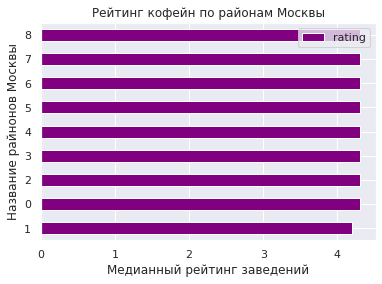

In [31]:
# возвращаем средний рейтинг кофейн по округам
rating_median_cof = df[df['category'] =='кофейня'].groupby('district')['rating']\
                    .agg('median').reset_index().sort_values(by = 'rating')

fig = rating_median_cof.plot.barh(color = 'purple')
fig.set_xlabel('Медианный рейтинг заведений')
fig.set_ylabel('Название райнонов Москвы')
fig.set_title('Рейтинг кофейн по районам Москвы')

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
Сортировка.
</div>

<div class="alert alert-info"> <b>Комментарий студента: Отсортировал :)</b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> +
</div>

**Вывод:** Практически по всем округам средний рейтинг у кофейн одинаковый, самый низкий рейтинг в Западном округе. Возможно это потому что там до сих пор нет нормальных кофейн и есть возможность показать, как должна выглядеть крутая кофейня.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Согласна:)
</div>

In [32]:
# возвращаем медианную стоимость чашки кофе.
medium_price_coffee = df[df['category'] =='кофейня'].groupby('category')['middle_coffee_cup'].agg('median')
print(f'Средняя стоимость чашки кофе: {round(medium_price_coffee[0])} рублей.')

Средняя стоимость чашки кофе: 170 рублей.


**Вывод:** Ориентироваться стоит на медианную стоимость чашки кофе при открытии кофейни в 170 рублей, потому что большие отклонения от 170 рублей в большую сторону не позволят предложить вам конкурентно способные условия для ведения бизнеса, а при отклонении в меньшую создают условия демпинга цены и повышает риск потери прибыли,а также существует возможность отсутствия достаточного оборота для покрытия постоянных и временных издержек.

**Рекомендации:** Исходя из анализа рынка, кофейню лучше всего открывать в таких районах, как Северо-Западный или Юго-Восточный, так как там наименьшая конкуренция. Медианная цена за чашку кофе должна быть в пределах 170 рублей, для того,чтобы создать конкрутентные условия на рынке и покрывать постоянные и временные издержки. 

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Обоснованно!
</div>

## Подготовка презентации

Презентация: <https://disk.yandex.ru/i/4RxfRztxMYKTZA>

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Отличная информативная презентация! Но будет лучше и красивее, если отсортируешь и заменишь парочку графиков:)
</div>

<div class="alert alert-info"> <b>Комментарий студента: В презентации слайды исправил :)</b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Никита, молодец, оперативно откорректировал проект! Благодарю за обратную связь. Работа принята, удачи в обучении:)
</div>

<div style="border:solid Chocolate 2px; padding: 40px">
Никита, давай подведем итоги. Ты большой молодец, что старался и проделал такую большую работу. Мне понравилось, что ты наполнил проект развернутыми выводами и наглядно продемонстрировал каждое задание:)
 
    Разберем над чем стоит поработать:

    1. Проверить датасет на дубликаты.

    2. Отсортировать данные на графиках.

    3. Не забывай про подписи названий и осей у графиков.
    
    Пересмотри работу и исправь ошибки. Обязательно пиши, если я могу тебе еще чем-то помочь. Удачи!)
  